<h3> Important Note: </h3>
    
**This notebook was used only to try out the data preparation for the regression, its results were not used for the written report.**

In [10]:
# Make inline plots vector graphics
%matplotlib inline
#from IPython.display import set_matplotlib_formats
import matplotlib_inline.backend_inline

matplotlib_inline.backend_inline.set_matplotlib_formats("pdf", "svg")

# Plotting setup
import matplotlib.pyplot as plt
import datetime

# Package imports
import numpy as np
import pandas as pd
import geopandas as gpd
import ssl
ssl._create_default_https_context = ssl._create_unverified_context

In [11]:
# Read CSV data file and plot head
data_nyc = pd.read_csv("../dat/yellow_tripdata_2021-01.csv")
data_nyc.head()

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/IPython/core/interactiveshell.py:3457: DtypeWarning: Columns (6) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge
0,1.0,2021-01-01 00:30:10,2021-01-01 00:36:12,1.0,2.10,1.0,N,142,43,2.0,8.0,3.0,0.5,0.00,0.0,0.3,11.80,2.5
1,1.0,2021-01-01 00:51:20,2021-01-01 00:52:19,1.0,0.20,1.0,N,238,151,2.0,3.0,0.5,0.5,0.00,0.0,0.3,4.30,0.0
2,1.0,2021-01-01 00:43:30,2021-01-01 01:11:06,1.0,14.70,1.0,N,132,165,1.0,42.0,0.5,0.5,8.65,0.0,0.3,51.95,0.0
3,1.0,2021-01-01 00:15:48,2021-01-01 00:31:01,0.0,10.60,1.0,N,138,132,1.0,29.0,0.5,0.5,6.05,0.0,0.3,36.35,0.0
4,2.0,2021-01-01 00:31:49,2021-01-01 00:48:21,1.0,4.94,1.0,N,68,33,1.0,16.5,0.5,0.5,4.06,0.0,0.3,24.36,2.5


In [12]:
# Read SHP data from file and plot head
nyc_geo_df = gpd.read_file("../dat/taxi_zones/taxi_zones.shp")
nyc_geo_df.head()

,OBJECTID,Shape_Leng,Shape_Area,zone,LocationID,borough,geometry
0,1,0.116357,0.000782,Newark Airport,1,EWR,"POLYGON ((933100.918 192536.086, 933091.011 19..."
1,2,0.433470,0.004866,Jamaica Bay,2,Queens,"MULTIPOLYGON (((1033269.244 172126.008, 103343..."
2,3,0.084341,0.000314,Allerton/Pelham Gardens,3,Bronx,"POLYGON ((1026308.770 256767.698, 1026495.593 ..."
3,4,0.043567,0.000112,Alphabet City,4,Manhattan,"POLYGON ((992073.467 203714.076, 992068.667 20..."
4,5,0.092146,0.000498,Arden Heights,5,Staten Island,"POLYGON ((935843.310 144283.336, 936046.565 14..."


In [13]:
# Data preparation
data = data_nyc

from datetime import datetime

# get trip duration (target variable)
trip_duration = (pd.to_datetime(data['tpep_dropoff_datetime'], format='%Y-%m-%d %H:%M:%S')) - (pd.to_datetime(data['tpep_pickup_datetime'], format='%Y-%m-%d %H:%M:%S'))
# add trip duration to dataframe
data.insert(len(data.columns), 'trip_duration', trip_duration.astype('timedelta64[s]'))

hour = pd.to_datetime(data['tpep_pickup_datetime'], format='%Y-%m-%d %H:%M:%S').dt.hour
minute = pd.to_datetime(data['tpep_pickup_datetime'], format='%Y-%m-%d %H:%M:%S').dt.minute
second = pd.to_datetime(data['tpep_pickup_datetime'], format='%Y-%m-%d %H:%M:%S').dt.second 

second_of_the_day = (hour * 3600) + (minute * 60) + second
data.insert(len(data.columns), 'second_of_the_day', second_of_the_day)

weekday = pd.to_datetime(data['tpep_pickup_datetime'], format='%Y-%m-%d %H:%M:%S').dt.dayofweek
data.insert(len(data.columns), 'weekday', weekday)

month = pd.to_datetime(data['tpep_pickup_datetime'], format='%Y-%m-%d %H:%M:%S').dt.month
data.insert(len(data.columns), 'month', month)

year = pd.to_datetime(data['tpep_pickup_datetime'], format='%Y-%m-%d %H:%M:%S').dt.year
data.insert(len(data.columns), 'year', year)

data = data[['PULocationID', 'DOLocationID', 'passenger_count', 'second_of_the_day', 'weekday', 'month', 'year', 'trip_duration']]

print(data.head())
print(data.tail())

   PULocationID  DOLocationID  passenger_count  second_of_the_day  weekday  \
0           142            43              1.0               1810        4   
1           238           151              1.0               3080        4   
2           132           165              1.0               2610        4   
3           138           132              0.0                948        4   
4            68            33              1.0               1909        4   

   month  year  trip_duration  
0      1  2021          362.0  
1      1  2021           59.0  
2      1  2021         1656.0  
3      1  2021          913.0  
4      1  2021          992.0  


In [24]:
# Allow import of own scripts #
import sys, os
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)
    
from src.preprocess_data import preprocess_data

data_nyc = preprocess_data(data_nyc)

print(len(data_nyc))

About 0.00% of the entire data could not be used due to missing information (NaN).
1271413


In [25]:
len(data_nyc)

#data = data_nyc

target_clm = 'trip_duration' # the critical temperature is our target variable
n_trainset = 1000000 # size of the training set
n_testset = 271413 #size of the test set

# set random seed to make sure every test set is the same
np.random.seed(seed=1)

idx = np.arange(data.shape[0])
idx_shuffled = np.random.permutation(idx) # shuffle indices to split into training and test set

test_idx = idx_shuffled[:n_testset]
train_idx = idx_shuffled[n_testset:n_testset+n_trainset]
train_full_idx = idx_shuffled[n_testset:]

X_test = data.loc[test_idx, data.columns != target_clm].values
y_test = data.loc[test_idx, data.columns == target_clm].values
print('Test set shapes (X and y)', X_test.shape, y_test.shape)

X_train = data.loc[train_idx, data.columns != target_clm].values
y_train = data.loc[train_idx, data.columns == target_clm].values
print('Small training set shapes (X and y):',X_train.shape, y_train.shape)

Test set shapes (X and y) (271413, 7) (271413, 1)
Small training set shapes (X and y): (1000000, 7) (1000000, 1)


In [ ]:
# Scatter plots of the target variable vs. features

# create new figure with certain size
plt.figure(figsize=[10,15])

# create 81 subplots
for i in range(2):
    # 81 subplots with space between each other
    plt.subplot(1, 2, (i+1))
    plt.subplots_adjust(wspace=1, hspace=0.5)
    
    # scatter plot with target variable vs. features
    plt.scatter(X_train[:,i], y_train)
    
    # labeling
    plt.xlabel(data.columns[i])
    plt.ylabel('Trip duration')
    
# plotting
plt.show()

In [26]:
def plot_regression_results(y_test,y_pred,weights):
    '''Produces three plots to analyze the results of linear regression:
        -True vs predicted
        -Raw residual histogram
        -Weight histogram
        
    Inputs:
        y_test: (n_observations,) numpy array with true values
        y_pred: (n_observations,) numpy array with predicted values
        weights: (n_weights) numpy array with regression weights'''
    
    print('MSE: ', mean_squared_error(y_test,y_pred))
    print('r^2: ', r2_score(y_test,y_pred))
    
    fig,ax = plt.subplots(1,3,figsize=(9,3))
    #predicted vs true
    ax[0].scatter(y_test,y_pred)
    ax[0].set_title('True vs. Predicted')
    ax[0].set_xlabel('True %s' % (target_clm))
    ax[0].set_ylabel('Predicted %s' % (target_clm))

    #residuals
    error = np.squeeze(np.array(y_test)) - np.squeeze(np.array(y_pred))
    ax[1].hist(np.array(error),bins=30)
    ax[1].set_title('Raw residuals')
    ax[1].set_xlabel('(true-predicted)')

    #weight histogram
    ax[2].hist(weights,bins=30)
    ax[2].set_title('weight histogram')

    plt.tight_layout()

In [27]:
def sklearn_regression(X_test, X_train, y_train):
    '''Computes OLS weights for linear regression without regularization using the sklearn library on the training set and 
       returns weights and testset predictions.
    
       Inputs:
         X_test: (n_observations, 81), numpy array with predictor values of the test set 
         X_train: (n_observations, 81), numpy array with predictor values of the training set
         y_train: (n_observations,) numpy array with true target values for the training set
         
       Outputs:
         weights: The weight vector for the regerssion model including the offset
         y_pred: The predictions on the TEST set
          
         
       Note:
         The sklearn library automatically takes care of adding a column for the offset.     
    
    '''
    # fit linear model via sklearn with OLS estimator
    reg = linear_model.LinearRegression().fit(X_train, y_train)
    # get intercept
    intercept = reg.intercept_
    # get other weights and transpose
    weights = reg.coef_.T
    # aggregate intercept and coefficients into one row vector
    weights = np.vstack((intercept , weights))
    # get y_pred
    y_pred = reg.predict(X_test)
    
    return weights, y_pred

In [28]:
from sklearn import linear_model
from sklearn.metrics import mean_squared_error, r2_score

In [29]:
weights, y_pred = sklearn_regression(X_test, X_train, y_train)
plot_regression_results(y_test, y_pred, weights)

ValueError: Input contains NaN, infinity or a value too large for dtype('float64').

In [58]:
fields_name = [field[0] for field in nyc_geo_df[1:]]
print(fields_name)

print(nyc_geo_df)

['O', 'S', 'S', 'z', 'L', 'b', 'g']
     OBJECTID  Shape_Leng  Shape_Area                     zone  LocationID  \
0           1    0.116357    0.000782           Newark Airport           1   
1           2    0.433470    0.004866              Jamaica Bay           2   
2           3    0.084341    0.000314  Allerton/Pelham Gardens           3   
3           4    0.043567    0.000112            Alphabet City           4   
4           5    0.092146    0.000498            Arden Heights           5   
..        ...         ...         ...                      ...         ...   
258       259    0.126750    0.000395       Woodlawn/Wakefield         259   
259       260    0.133514    0.000422                 Woodside         260   
260       261    0.027120    0.000034       World Trade Center         261   
261       262    0.049064    0.000122           Yorkville East         262   
262       263    0.037017    0.000066           Yorkville West         263   

           borough         

In [10]:
# Plot map
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable

nyc_geo_df.plot(figsize=(7.5, 7.5))

<AxesSubplot:>

In [11]:
%matplotlib inline
nyc_geo_df.plot(column='borough', categorical=True)

print(nyc_geo_df['borough'])

len(nyc_geo_df)

0                EWR
1             Queens
2              Bronx
3          Manhattan
4      Staten Island
           ...      
258            Bronx
259           Queens
260        Manhattan
261        Manhattan
262        Manhattan
Name: borough, Length: 263, dtype: object


263

     OBJECTID  Shape_Leng  Shape_Area                       zone  LocationID  \
3           4    0.043567    0.000112              Alphabet City           4   
11         12    0.036661    0.000042               Battery Park          12   
12         13    0.050281    0.000149          Battery Park City          13   
23         24    0.047000    0.000061               Bloomingdale          24   
40         41    0.052793    0.000143             Central Harlem          41   
..        ...         ...         ...                        ...         ...   
245       246    0.069467    0.000281  West Chelsea/Hudson Yards         246   
248       249    0.036384    0.000072               West Village         249   
260       261    0.027120    0.000034         World Trade Center         261   
261       262    0.049064    0.000122             Yorkville East         262   
262       263    0.037017    0.000066             Yorkville West         263   

       borough                         

<AxesSubplot:>

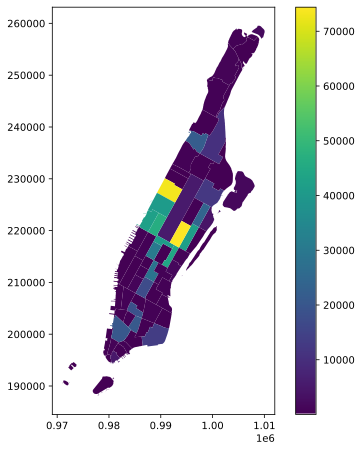

In [8]:
nyc_geo_df = nyc_geo_df[nyc_geo_df["borough"] == "Manhattan"]
print(nyc_geo_df)

nyc_geo_df.plot(column='Pickups', legend=True, figsize=(7.5, 7.5))

Datashader TEST: https://www.danielforsyth.me/mapping-nyc-taxi-data/